# PROJECT VISION - Rediscovering Mobility For Blind

In [1]:
import numpy as np
import cv2
import argparse
import sys
from  matplotlib import pyplot as plt
from pymongo import MongoClient
import datetime
import time

# 1. Cam Calibration

In [2]:
def load_stereo_coefficients(path):
    """ 
    Loads stereo matrix coefficients. 
    """
    # FILE_STORAGE_READ
    cv_file = cv2.FileStorage(path, cv2.FILE_STORAGE_READ)

    # note we also have to specify the type to retrieve other wise we only get a
    # FileNode object back instead of a matrix
    K1 = cv_file.getNode("K1").mat()
    D1 = cv_file.getNode("D1").mat()
    K2 = cv_file.getNode("K2").mat()
    D2 = cv_file.getNode("D2").mat()
    R = cv_file.getNode("R").mat()
    T = cv_file.getNode("T").mat()
    E = cv_file.getNode("E").mat()
    F = cv_file.getNode("F").mat()
    R1 = cv_file.getNode("R1").mat()
    R2 = cv_file.getNode("R2").mat()
    P1 = cv_file.getNode("P1").mat()
    P2 = cv_file.getNode("P2").mat()
    Q = cv_file.getNode("Q").mat()

    cv_file.release()
    return [K1, D1, K2, D2, R, T, E, F, R1, R2, P1, P2, Q]

In [3]:
K1, D1, K2, D2, R, T, E, F, R1, R2, P1, P2, Q = load_stereo_coefficients(
    "calibration/calibration_file.txt"
)  # Get cams params

# 2. Finding the distance of each pixel of the image

In [4]:
def depth_map(imgL, imgR):
    """ 
    Depth map calculation. Works with SGBM and WLS. 
    Need rectified images, returns depth map ( left to right disparity ) 
    """
    # SGBM Parameters
    window_size = 7  
    # wsize 
    # default 3; 5; 
    # 7 for SGBM reduced size image; 
    # 15 for SGBM full size image (1300px and above); 
    # 5 Works nicely

    left_matcher = cv2.StereoSGBM_create(
        minDisparity=1,
        numDisparities= 5 * 16,  # max_disp has to be dividable by 16 f. E. HH 192, 256
        blockSize= window_size,
        P1=8 * 3 * window_size,
        P2= 32 * 3 * window_size,
        disp12MaxDiff=12,
        uniquenessRatio=10,
        speckleWindowSize=50,
        speckleRange=32,
        preFilterCap=63,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY,
    )
    # wls_filter.setSigmaColor(sigma)
    displ = left_matcher.compute(imgL, imgR).astype(np.float32) / 16
    return displ

In [5]:
path_dir = 'yolo'
#extracting network from yolov3.weights 
net = cv2.dnn.readNet(f'{path_dir}/yolov3.weights' , f'{path_dir}/yolov3.cfg')

#extracting the name of objects
with open(f'{path_dir}/coco.names','r' ) as f:
    classes = f.read().splitlines()

In [6]:
capL = cv2.VideoCapture(2)
capR = cv2.VideoCapture(0)

Images from camera: 


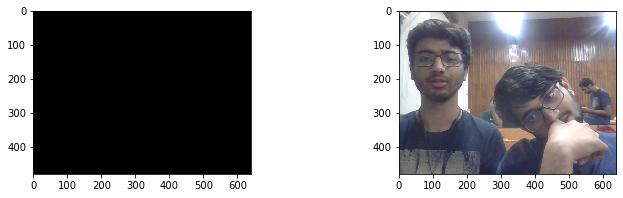

After rectification: 


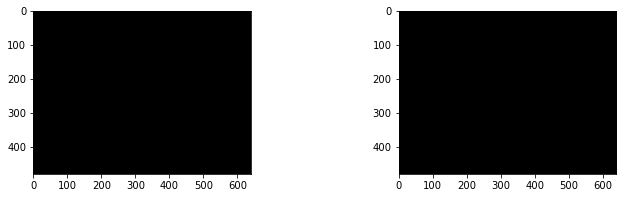

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


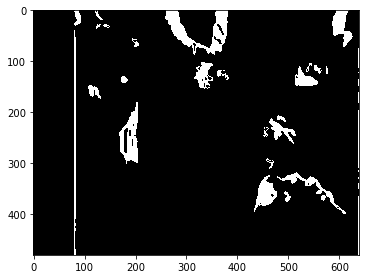

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]]
[[14]
 [ 2]
 [11]]
detected object:  person
confidence:  1.0
x-coordinate:  525 	 y-coordinate:indexes 196
width:  103 	 height:  147
person distance: 1.12m

detected object:  person
confidence:  1.0
x-coordinate:  2 	 y-coordinate:indexes 29
width:  322 	 height:  422
person distance: 1.08m

detected object:  person
confidence:  0.99
x-coordinate:  270 	 y-coordinate:indexes 161
width:  367 	 height:  313
person distance: 1.12m



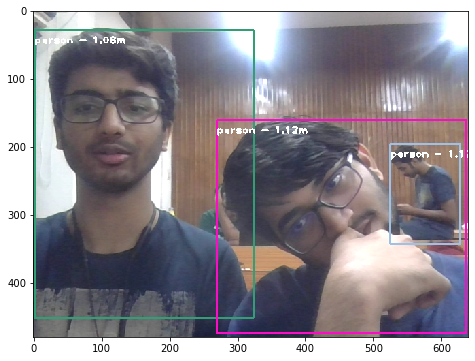

Images from camera: 


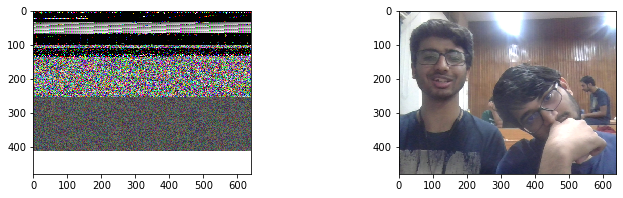

After rectification: 


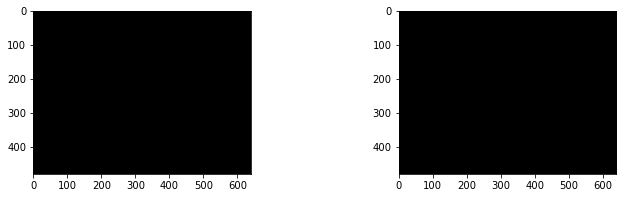

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


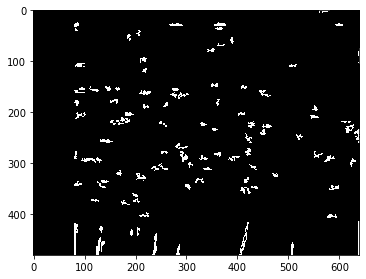

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]]
[[ 2]
 [14]
 [11]]
detected object:  person
confidence:  1.0
x-coordinate:  0 	 y-coordinate:indexes 28
width:  323 	 height:  426
person distance: 2.92m

detected object:  person
confidence:  1.0
x-coordinate:  528 	 y-coordinate:indexes 188
width:  94 	 height:  159
person distance: 2.73m

detected object:  person
confidence:  1.0
x-coordinate:  265 	 y-coordinate:indexes 157
width:  372 	 height:  310
person distance: 3.02m



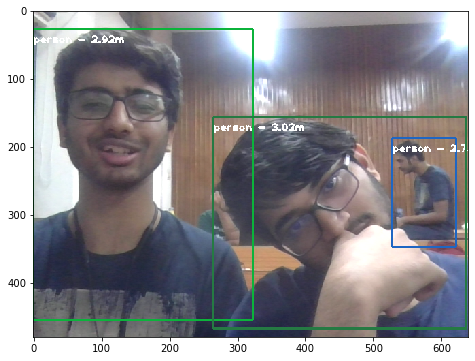

Images from camera: 


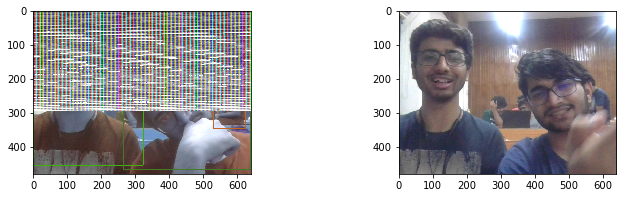

After rectification: 


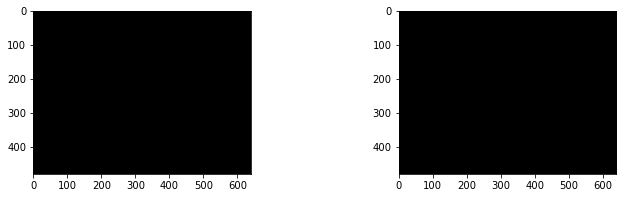

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


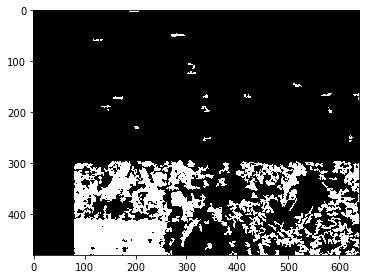

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  4.1112919e+00 4.1373124e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]]
[[ 2]
 [ 7]
 [16]
 [11]]
detected object:  person
confidence:  1.0
x-coordinate:  -1 	 y-coordinate:indexes 24
width:  335 	 height:  437
person distance: 4.79m

detected object:  person
confidence:  1.0
x-coordinate:  289 	 y-coordinate:indexes 105
width:  349 	 height:  369
person distance: 3.23m

detected object:  person
confidence:  0.95
x-coordinate:  243 	 y-coordinate:indexes 250
width:  77 	 height:  96
person distance: 4.94

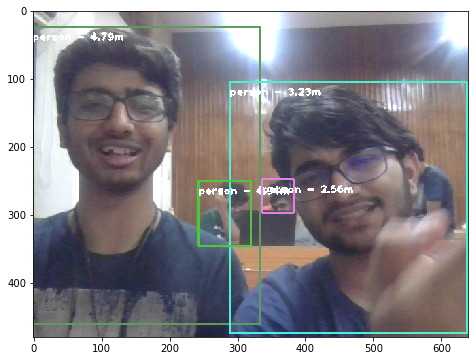

Images from camera: 


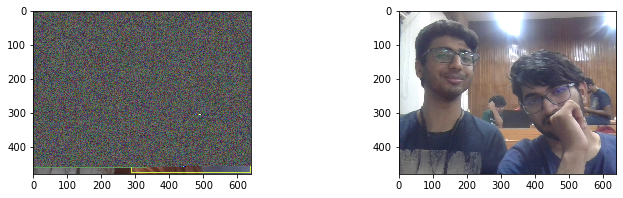

After rectification: 


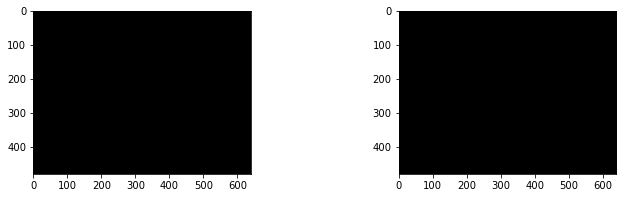

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


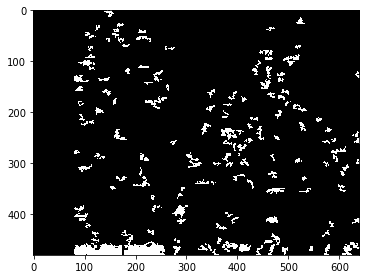

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [13]
 [10]
 [16]
 [21]]
detected object:  person
confidence:  1.0
x-coordinate:  -2 	 y-coordinate:indexes 19
width:  334 	 height:  440
person distance: 2.96m

detected object:  person
confidence:  0.99
x-coordinate:  537 	 y-coordinate:indexes 203
width:  91 	 height:  134
person distance: 2.87m

detected object:  person
confidence:  0.99
x-coordinate:  277 	 y-coordinate:indexes 111
width:  374 	 height:  376
person distance: 3.04m

detected object:  person


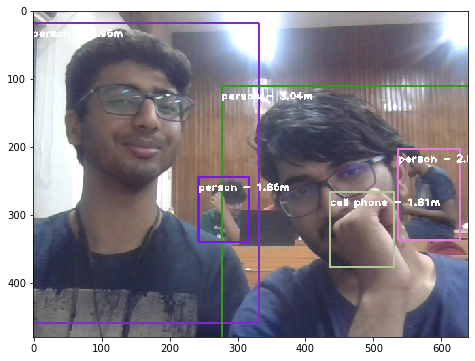

Images from camera: 


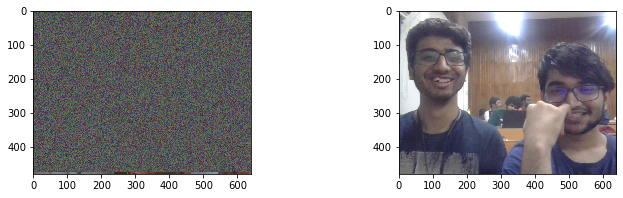

After rectification: 


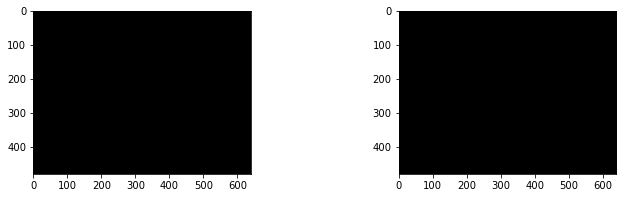

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


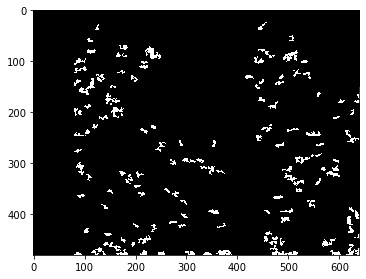

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.6549250e+00
  1.6383343e+00 1.6362838e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.6549250e+00
  1.6445167e+00 1.6362838e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.6549250e+00
  1.6465878e+00 1.6445167e+00]]
[[ 8]
 [ 2]
 [14]
 [15]
 [20]
 [17]
 [18]
 [10]]
detected object:  person
confidence:  1.0
x-coordinate:  279 	 y-coordinate:indexes 93
width:  372 	 height:  375
person distance: 3.06m

detected object:  person
confidence:  1.0
x-coordinate:  -4 	 y-coordinate:indexes 28
width:  337 	 height:  434
person distance: 3.02m

detected object:  person
confidence:  0.92
x-coordinate:  350 	 y-coordinate:indexes 245
width:  42 	 height:  4

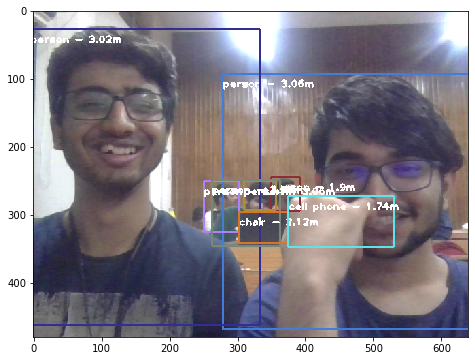

Images from camera: 


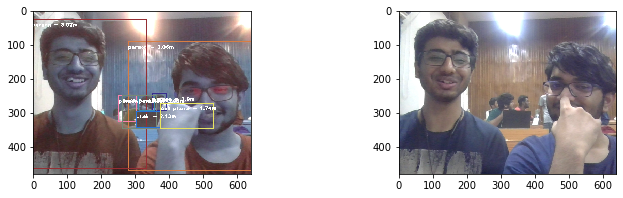

After rectification: 


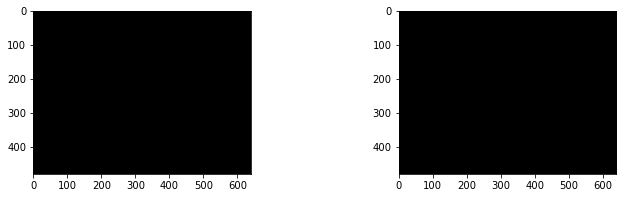

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


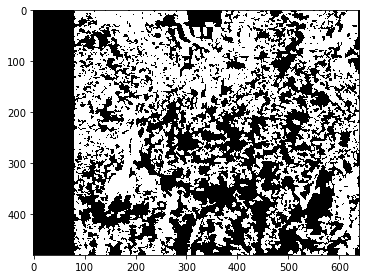

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [ 8]
 [17]
 [18]
 [20]
 [22]
 [14]]
detected object:  person
confidence:  1.0
x-coordinate:  1 	 y-coordinate:indexes 27
width:  338 	 height:  430
person distance: 6.2m

detected object:  person
confidence:  0.99
x-coordinate:  302 	 y-coordinate:indexes 83
width:  341 	 height:  405
person distance: 4.61m

detected object:  person
confidence:  0.91
x-coordinate:  257 	 y-coordinate:indexes 242
width:  87 	 height:  98
person distance: 2.78m

detected object: 

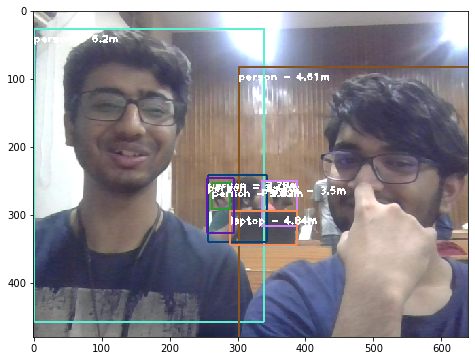

Images from camera: 


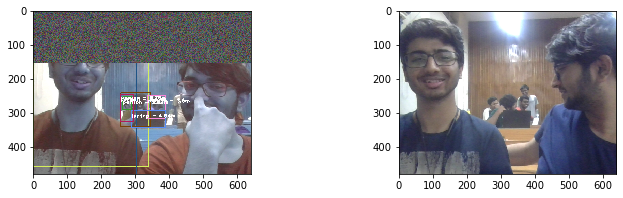

After rectification: 


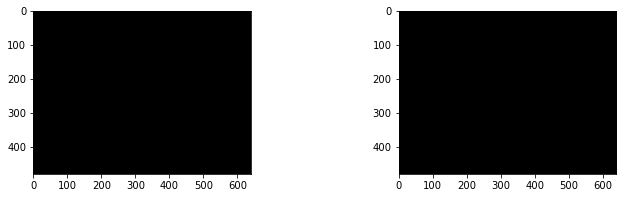

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


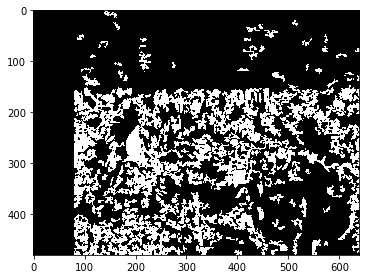

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 2]
 [18]
 [ 6]
 [16]]
detected object:  person
confidence:  1.0
x-coordinate:  0 	 y-coordinate:indexes 23
width:  349 	 height:  434
person distance: 4.27m

detected object:  person
confidence:  0.98
x-coordinate:  246 	 y-coordinate:indexes 251
width:  57 	 height:  76
person distance: 2.75m

detected object:  person
confidence:  0.97
x-coordinate:  205 	 y-coordinate:indexes 30
width:  438 	 height:  433
person distance: 4.23m

detected object:  person
confidenc

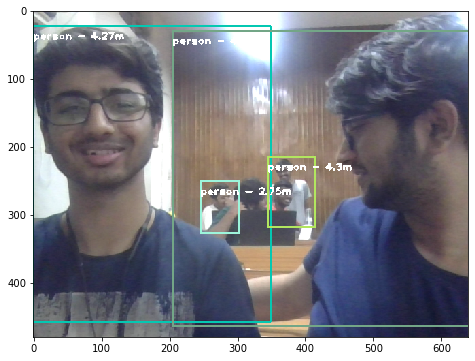

Images from camera: 


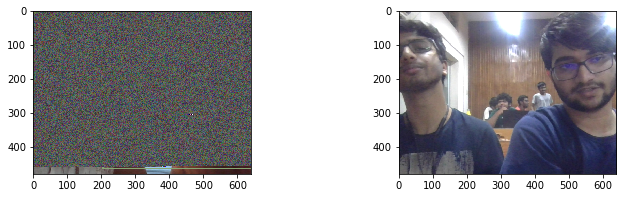

After rectification: 


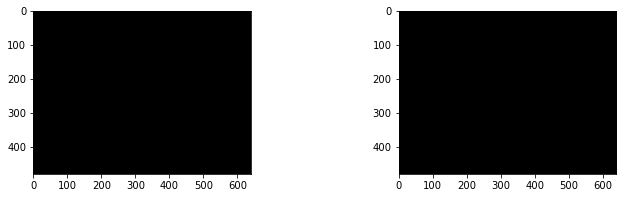

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


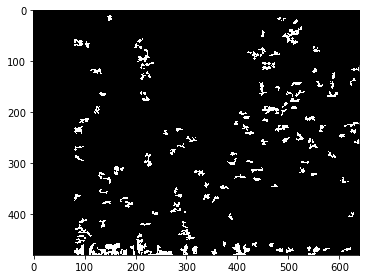

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [12]
 [ 6]
 [16]
 [20]
 [21]
 [15]]
detected object:  person
confidence:  1.0
x-coordinate:  -2 	 y-coordinate:indexes 20
width:  320 	 height:  443
person distance: 3.23m

detected object:  person
confidence:  1.0
x-coordinate:  390 	 y-coordinate:indexes 209
width:  64 	 height:  83
person distance: 3.44m

detected object:  person
confidence:  0.99
x-coordinate:  289 	 y-coordinate:indexes 14
width:  359 	 height:  445
person distance: 3.31m

detected object:

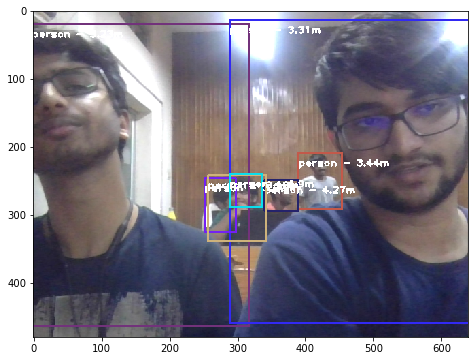

Images from camera: 


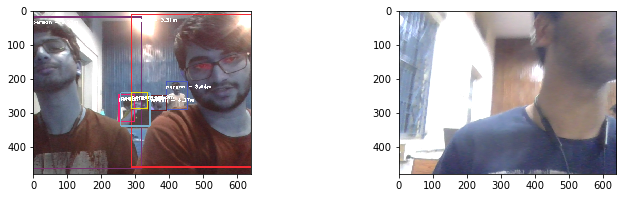

After rectification: 


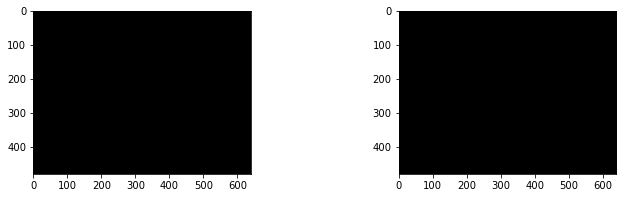

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


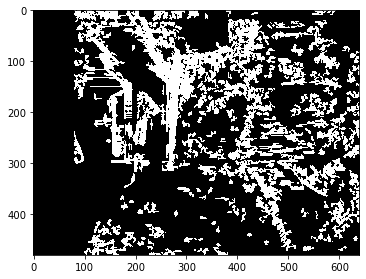

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[4]]
detected object:  person
confidence:  1.0
x-coordinate:  116 	 y-coordinate:indexes 24
width:  516 	 height:  421
person distance: 2.9m



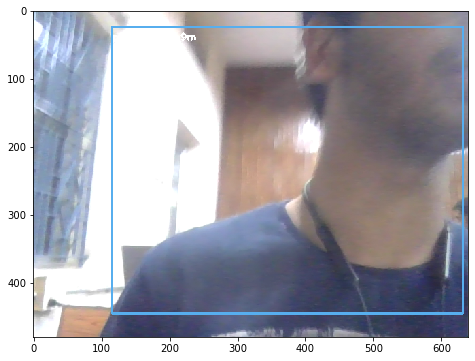

Images from camera: 


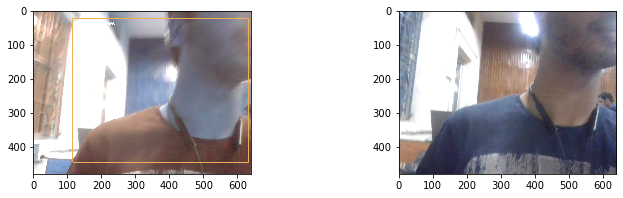

After rectification: 


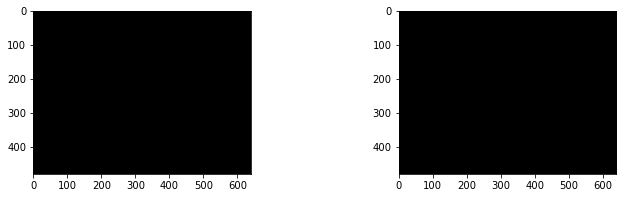

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


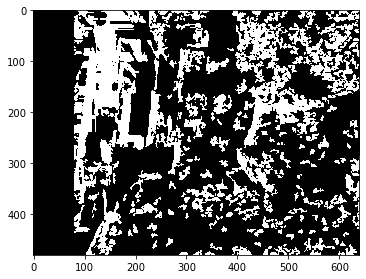

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.1917874e+00
  1.1950555e+00 1.1994411e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.1917874e+00
  1.1961489e+00 1.1994411e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.1917874e+00
  1.1961489e+00 1.2005424e+00]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]]
[[4]
 [8]]
detected object:  person
confidence:  1.0
x-coordinate:  75 	 y-coordinate:indexes 31
width:  557 	 height:  413
person distance: 3.8m

detected object:  person
confidence:  0.79
x-coordinate:  584 	 y-coordinate:indexes 239
width:  53 	 height:  59
person distance: 5.28m



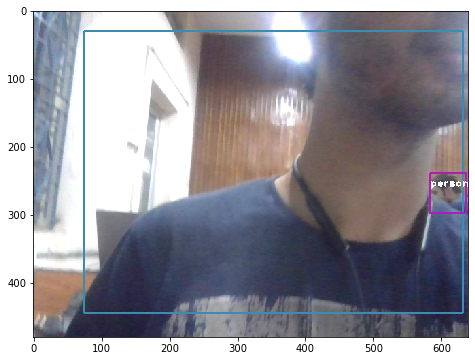

Images from camera: 


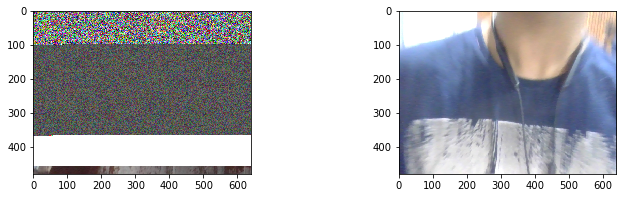

After rectification: 


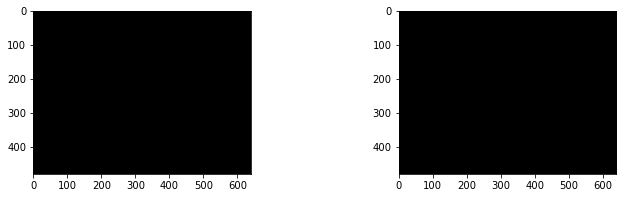

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


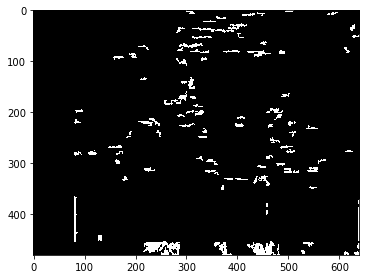

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 5.3802090e+00
  5.3581586e+00 5.3581586e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 5.3802090e+00
  5.3581586e+00 5.3581586e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 5.3581586e+00
  5.3581586e+00 5.3581586e+00]]
[[2]]
detected object:  person
confidence:  1.0
x-coordinate:  36 	 y-coordinate:indexes 14
width:  567 	 height:  463
person distance: 2.75m



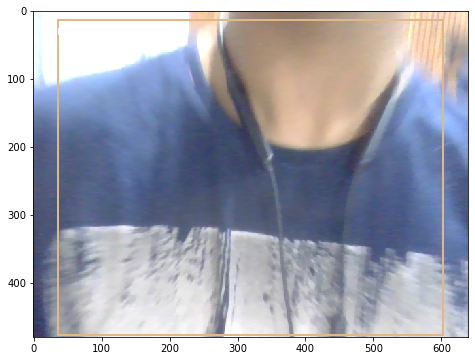

Images from camera: 


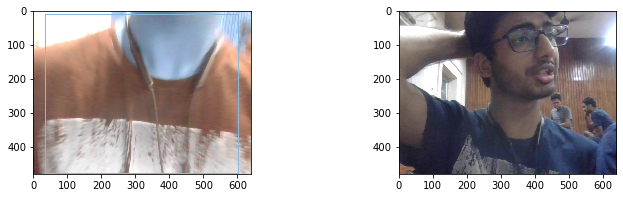

After rectification: 


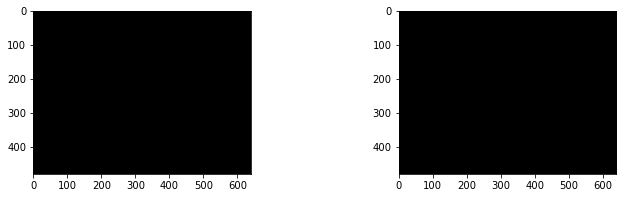

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


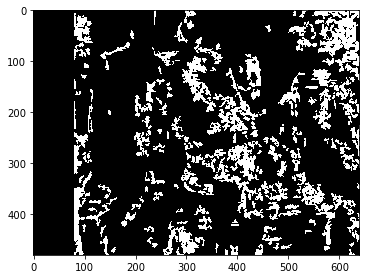

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  1.3849478e+00 1.3849478e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.3849478e+00
  1.3849478e+00 1.3849478e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.3849478e+00
  1.3834822e+00 1.3834822e+00]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]]
[[ 5]
 [13]
 [14]
 [18]]
detected object:  person
confidence:  1.0
x-coordinate:  7 	 y-coordinate:indexes 33
width:  615 	 height:  411
person distance: 2.36m

detected object:  person
confidence:  0.99
x-coordinate:  440 	 y-coordinate:indexes 244
width:  69 	 height:  107
person distance: 3.66m

detected object:  person
confidence:  0.98
x-coordinate:  538 	 y-coordinate:indexes 252
width:  88 	 height:  114
person distance: 3.01

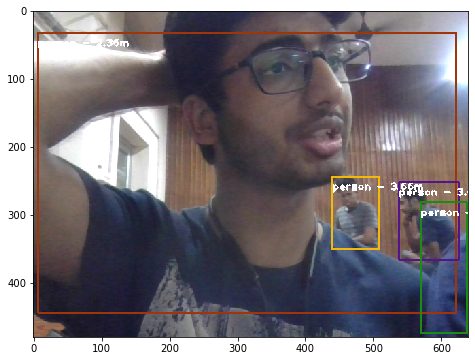

Images from camera: 


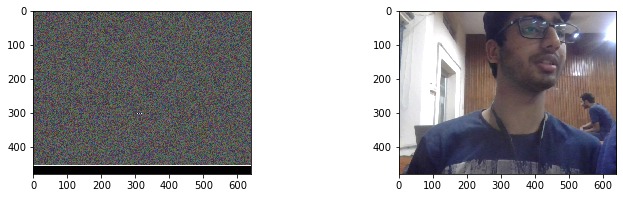

After rectification: 


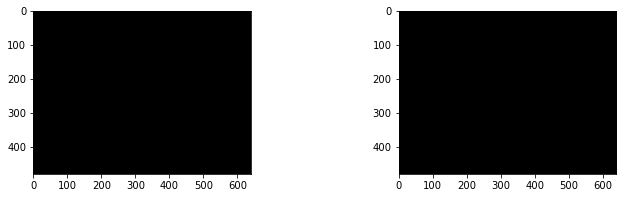

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


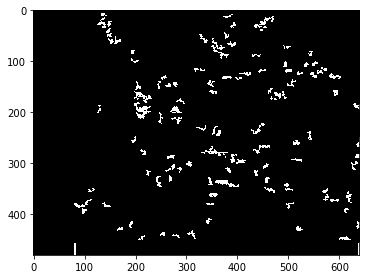

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]]
[[ 3]
 [11]
 [16]]
detected object:  person
confidence:  1.0
x-coordinate:  52 	 y-coordinate:indexes 32
width:  556 	 height:  411
person distance: 3.34m

detected object:  person
confidence:  1.0
x-coordinate:  523 	 y-coordinate:indexes 238
width:  107 	 height:  138
person distance: 3.45m

detected object:  person
confidence:  0.49
x-coordinate:  564 	 y-coordinate:indexes 311
width:  73 	 height:  167
person distance: 2.97m



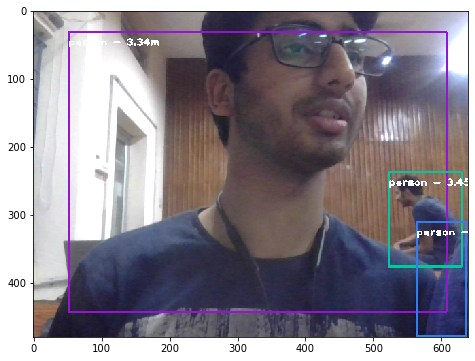

Images from camera: 


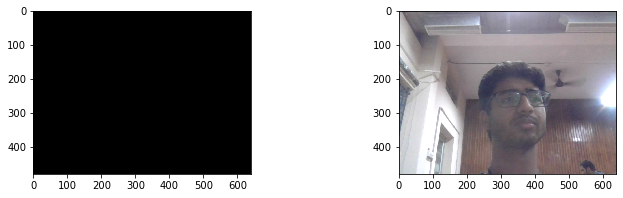

After rectification: 


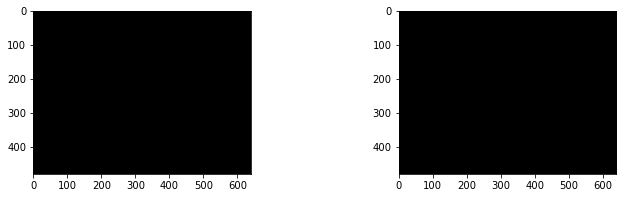

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


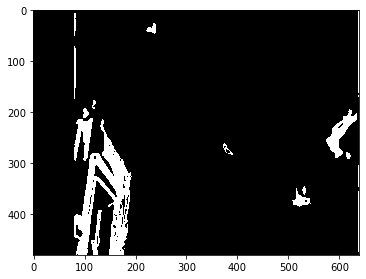

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]]
[[4]
 [8]]
detected object:  person
confidence:  0.96
x-coordinate:  81 	 y-coordinate:indexes 133
width:  489 	 height:  348
person distance: 1.12m

detected object:  person
confidence:  0.92
x-coordinate:  523 	 y-coordinate:indexes 438
width:  100 	 height:  40
person distance: 0.0m



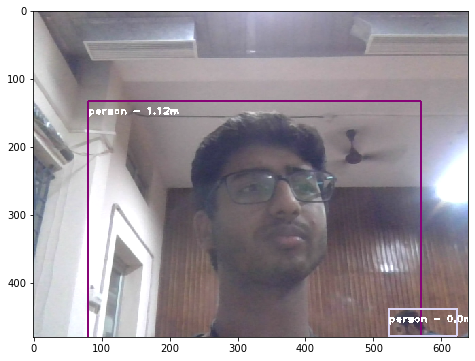

Images from camera: 


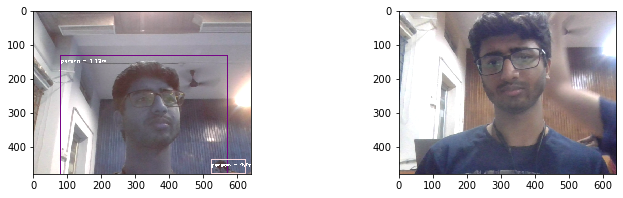

After rectification: 


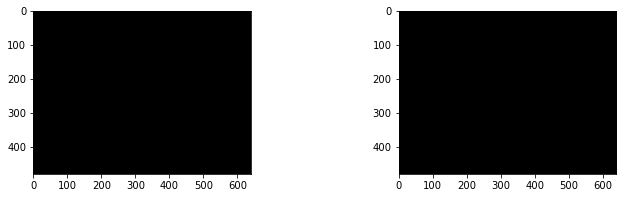

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


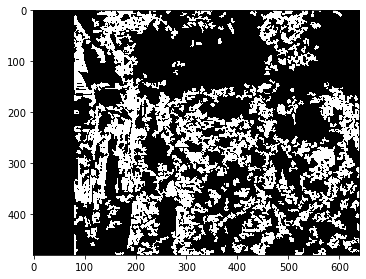

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[4]]
detected object:  person
confidence:  1.0
x-coordinate:  47 	 y-coordinate:indexes 20
width:  561 	 height:  432
person distance: 3.3m



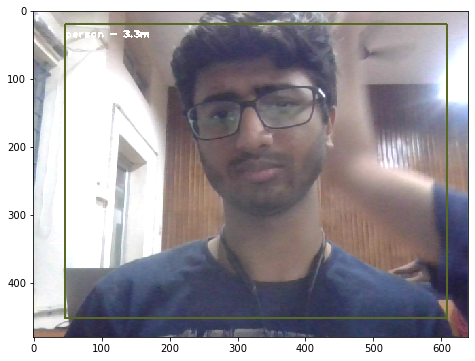

Images from camera: 


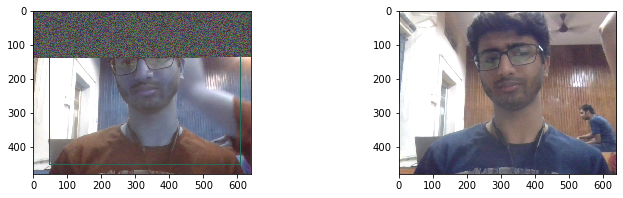

After rectification: 


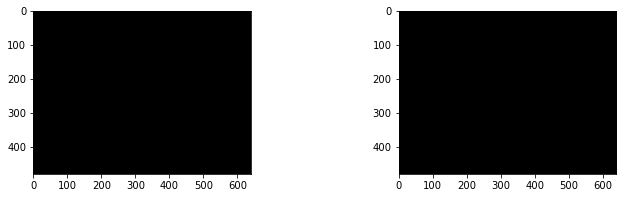

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


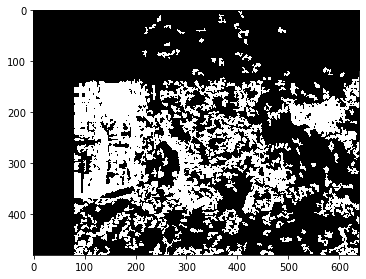

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 4]
 [11]]
detected object:  person
confidence:  1.0
x-coordinate:  51 	 y-coordinate:indexes 22
width:  553 	 height:  429
person distance: 4.66m

detected object:  person
confidence:  0.99
x-coordinate:  522 	 y-coordinate:indexes 270
width:  119 	 height:  145
person distance: 3.37m



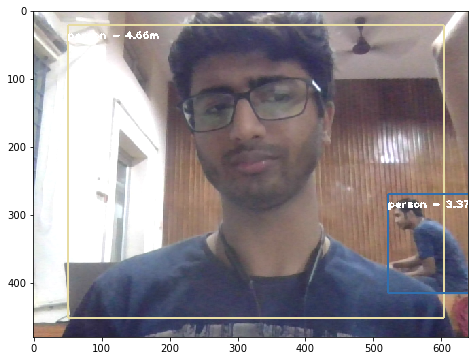

Images from camera: 


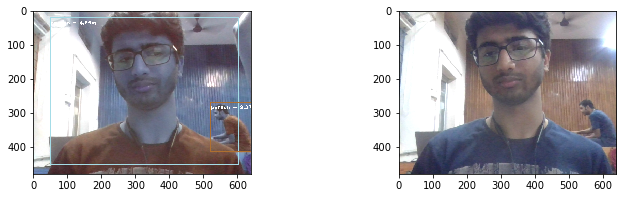

After rectification: 


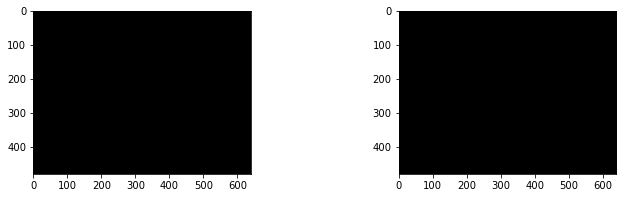

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


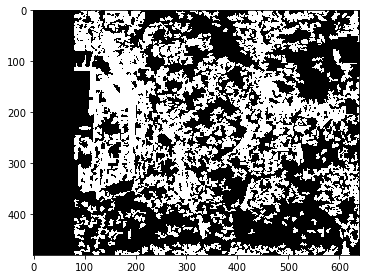

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 4]
 [12]]
detected object:  person
confidence:  1.0
x-coordinate:  61 	 y-coordinate:indexes 21
width:  542 	 height:  431
person distance: 5.18m

detected object:  person
confidence:  1.0
x-coordinate:  519 	 y-coordinate:indexes 265
width:  122 	 height:  141
person distance: 4.31m



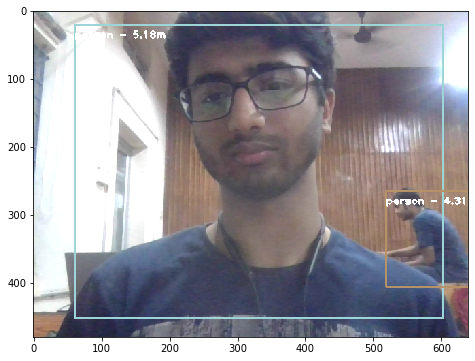

Images from camera: 


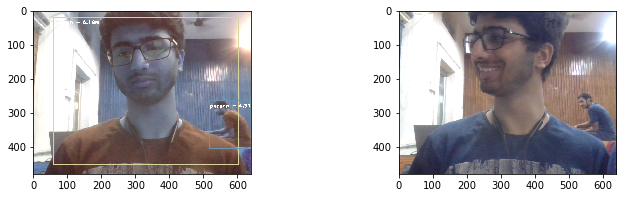

After rectification: 


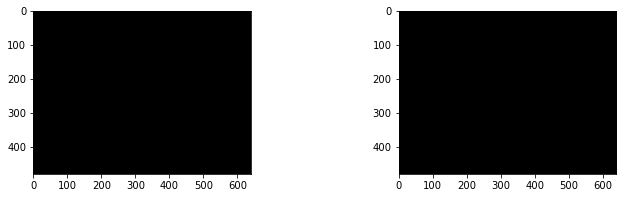

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


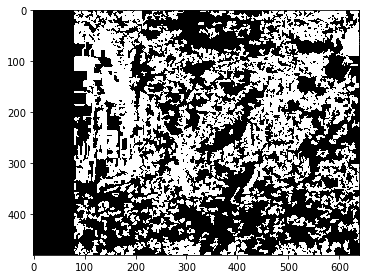

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.1778295e+01
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 1.1673132e+01
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]]
[[ 3]
 [10]
 [13]]
detected object:  person
confidence:  1.0
x-coordinate:  48 	 y-coordinate:indexes 27
width:  562 	 height:  421
person distance: 4.54m

detected object:  person
confidence:  1.0
x-coordinate:  516 	 y-coordinate:indexes 244
width:  122 	 height:  154
person distance: 3.5m

detected object:  person
confidence:  0.33
x-coordinate:  606 	 y-coordinate:indexes 380
width:  33 	 height:  98
person distance: 6.03m



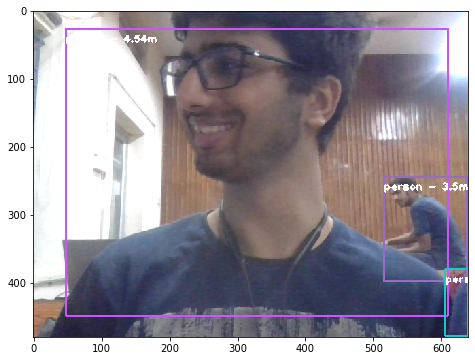

Images from camera: 


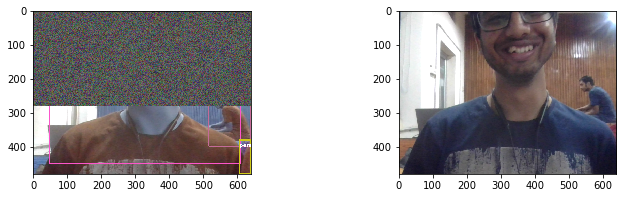

After rectification: 


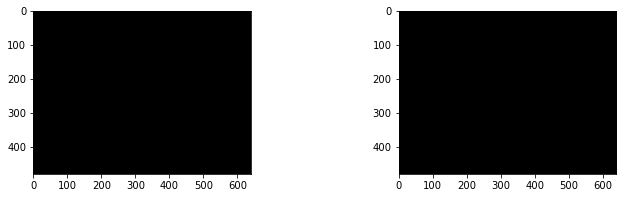

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


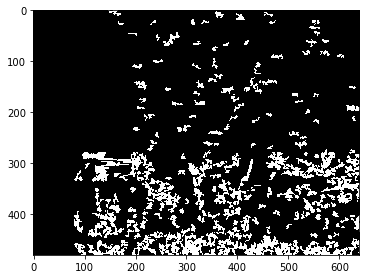

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  1.2693114e+00 1.2644011e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]]
[[ 3]
 [10]
 [13]]
detected object:  person
confidence:  1.0
x-coordinate:  36 	 y-coordinate:indexes 27
width:  591 	 height:  426
person distance: 3.52m

detected object:  person
confidence:  1.0
x-coordinate:  520 	 y-coordinate:indexes 193
width:  119 	 height:  141
person distance: 3.85m

detected object:  laptop
confidence:  0.59
x-coordinate:  47 	 y-coordinate:indexes 287
width:  82 	 height:  73
laptop distance: 2.24m



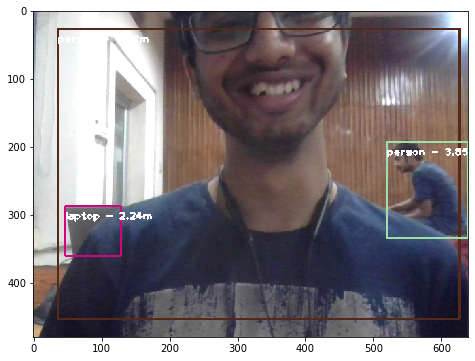

Images from camera: 


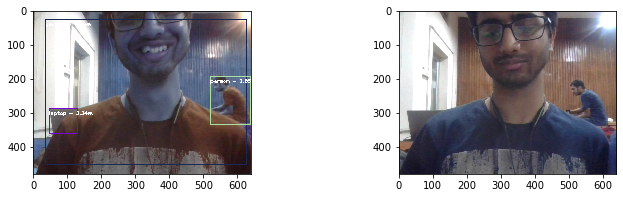

After rectification: 


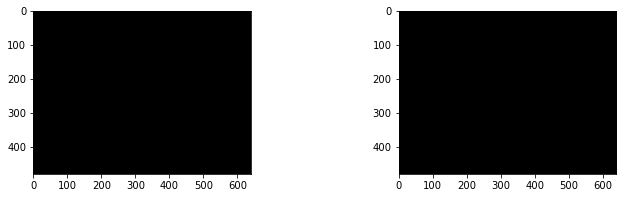

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


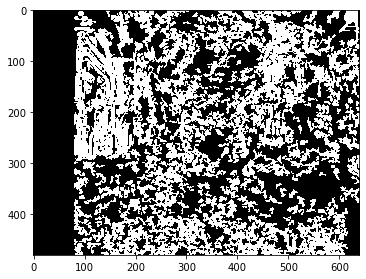

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [13]
 [10]]
detected object:  person
confidence:  1.0
x-coordinate:  45 	 y-coordinate:indexes 28
width:  566 	 height:  423
person distance: 4.17m

detected object:  person
confidence:  1.0
x-coordinate:  494 	 y-coordinate:indexes 207
width:  128 	 height:  148
person distance: 2.87m

detected object:  laptop
confidence:  0.45
x-coordinate:  14 	 y-coordinate:indexes 297
width:  138 	 height:  78
laptop distance: 4.04m



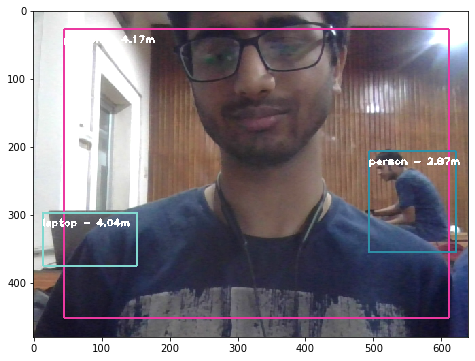

Images from camera: 


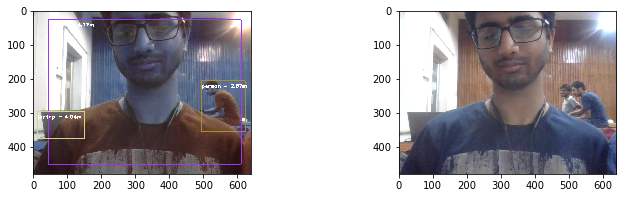

After rectification: 


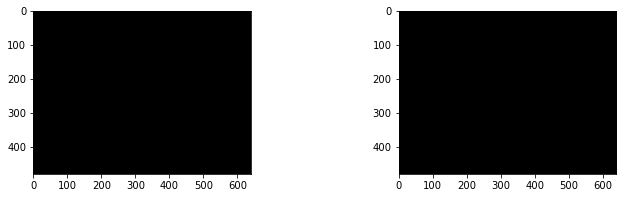

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


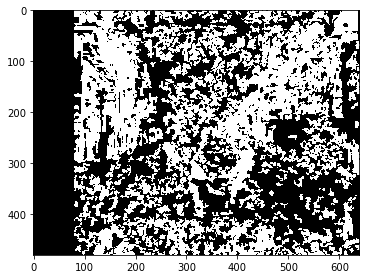

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [15]
 [11]
 [19]]
detected object:  person
confidence:  1.0
x-coordinate:  43 	 y-coordinate:indexes 24
width:  569 	 height:  432
person distance: 4.84m

detected object:  person
confidence:  1.0
x-coordinate:  491 	 y-coordinate:indexes 211
width:  133 	 height:  142
person distance: 3.94m

detected object:  person
confidence:  0.79
x-coordinate:  477 	 y-coordinate:indexes 216
width:  53 	 height:  91
person distance: 2.87m

detected object:  person
confiden

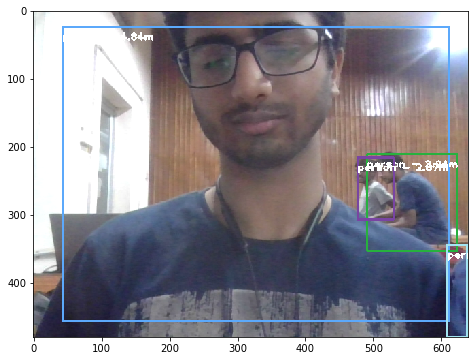

Images from camera: 


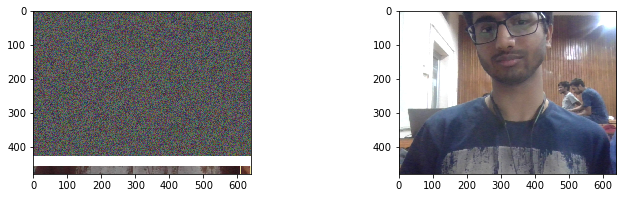

After rectification: 


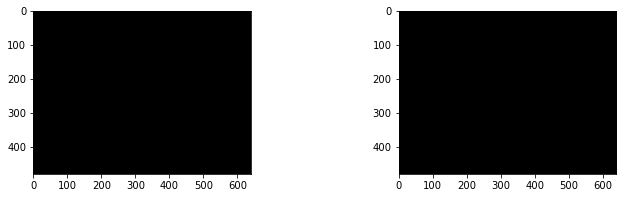

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


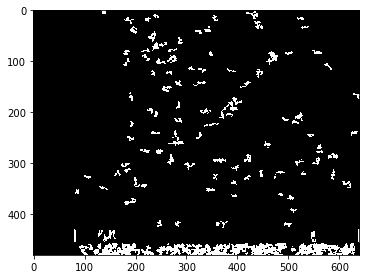

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [17]
 [11]
 [ 9]]
detected object:  person
confidence:  1.0
x-coordinate:  43 	 y-coordinate:indexes 29
width:  572 	 height:  423
person distance: 3.23m

detected object:  person
confidence:  1.0
x-coordinate:  494 	 y-coordinate:indexes 200
width:  128 	 height:  137
person distance: 3.46m

detected object:  person
confidence:  0.93
x-coordinate:  470 	 y-coordinate:indexes 207
width:  63 	 height:  85
person distance: 2.21m

detected object:  laptop
confiden

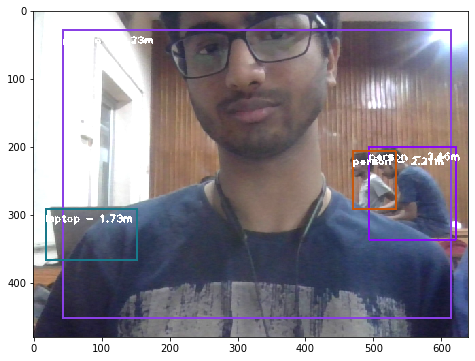

Images from camera: 


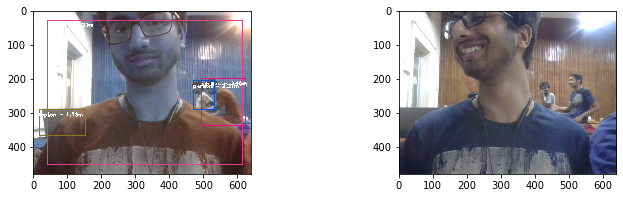

After rectification: 


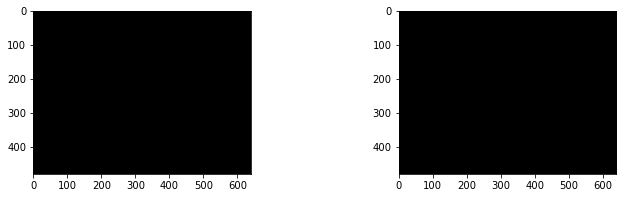

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


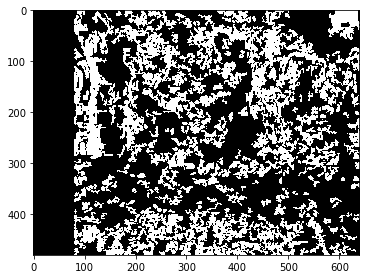

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [10]
 [13]
 [20]]
detected object:  person
confidence:  1.0
x-coordinate:  2 	 y-coordinate:indexes 21
width:  572 	 height:  436
person distance: 3.76m

detected object:  person
confidence:  0.99
x-coordinate:  409 	 y-coordinate:indexes 208
width:  51 	 height:  80
person distance: 5.08m

detected object:  person
confidence:  0.98
x-coordinate:  445 	 y-coordinate:indexes 188
width:  132 	 height:  146
person distance: 3.95m

detected object:  person
confiden

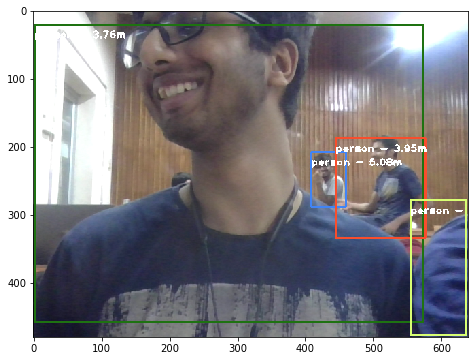

Images from camera: 


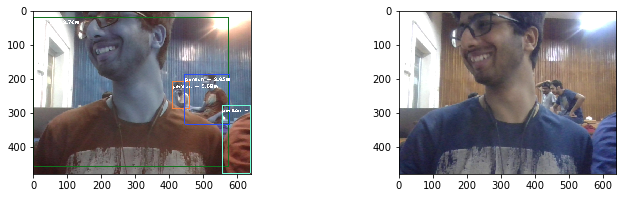

After rectification: 


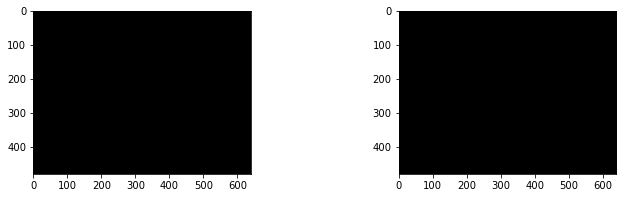

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


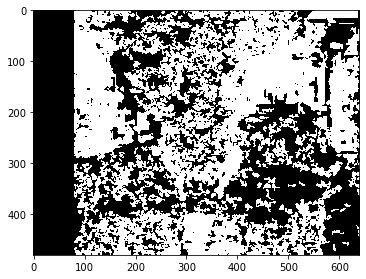

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [15]
 [10]
 [22]
 [24]]
detected object:  person
confidence:  1.0
x-coordinate:  6 	 y-coordinate:indexes 22
width:  567 	 height:  425
person distance: 4.21m

detected object:  person
confidence:  1.0
x-coordinate:  443 	 y-coordinate:indexes 199
width:  107 	 height:  139
person distance: 3.41m

detected object:  person
confidence:  0.92
x-coordinate:  410 	 y-coordinate:indexes 210
width:  51 	 height:  79
person distance: 4.05m

detected object:  person
con

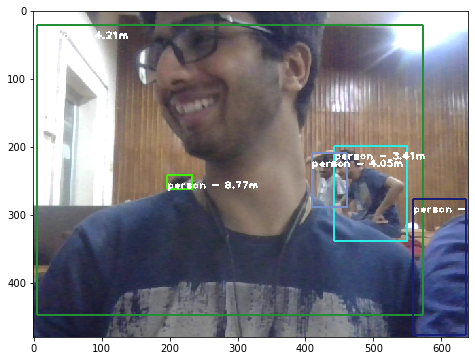

Images from camera: 


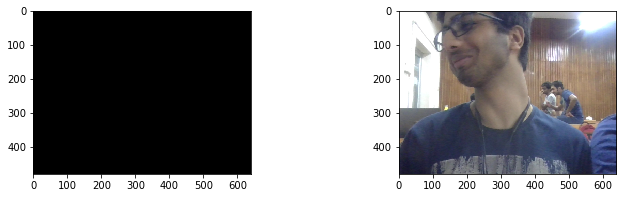

After rectification: 


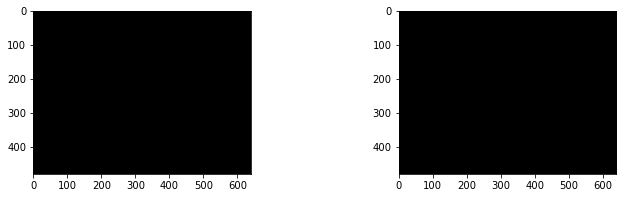

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


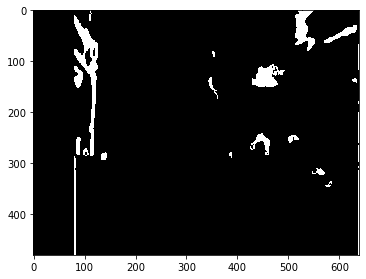

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+01
  8.171192e+01]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+01 8.171192e+01
  8.171192e+01]]
[[ 3]
 [20]
 [ 9]
 [27]]
detected object:  person
confidence:  1.0
x-coordinate:  8 	 y-coordinate:indexes 12
width:  559 	 height:  451
person distance: 1.11m

detected object:  person
confidence:  1.0
x-coordinate:  448 	 y-coordinate:indexes 211
width:  100 	 height:  140
person distance: 1.12m

detected object:  person
confidence:  0.85
x-coordinate:  410 	 y-coordinate:indexes 207
width:  49 	 height:  89
person distance: 1.12m

detected object:  person
confidenc

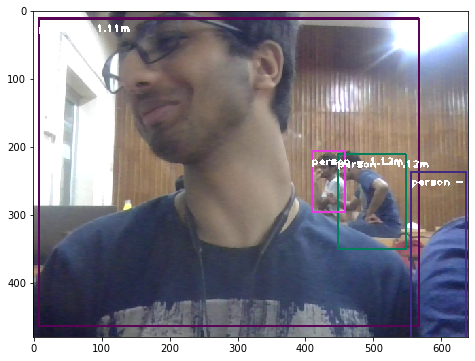

Images from camera: 


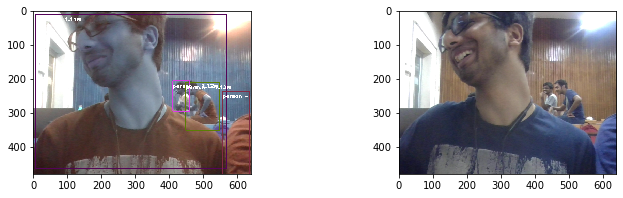

After rectification: 


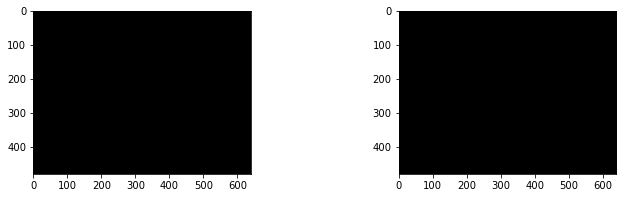

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


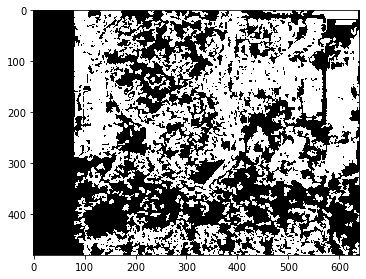

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 4.8065834e+00
  4.8065834e+00 4.7714992e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 4.8783236e+00
  4.8601885e+00 4.8421879e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]]
[[ 3]
 [18]
 [ 9]
 [24]]
detected object:  person
confidence:  1.0
x-coordinate:  4 	 y-coordinate:indexes 19
width:  568 	 height:  444
person distance: 5.64m

detected object:  person
confidence:  1.0
x-coordinate:  446 	 y-coordinate:indexes 207
width:  105 	 height:  146
person distance: 6.73m

detected object:  person
confidence:  0.95
x-coordinate:  413 	 y-coordinate:indexes 207
width:  52 	 height:  91
person distance: 6.92m

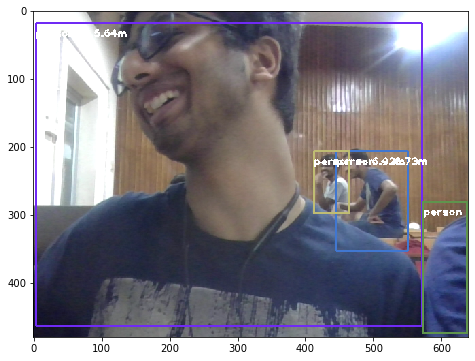

Images from camera: 


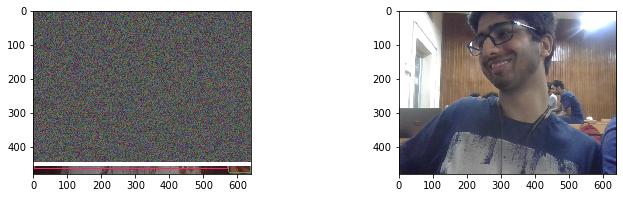

After rectification: 


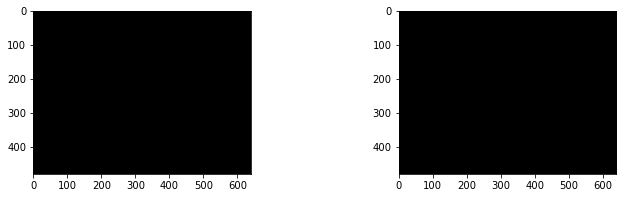

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


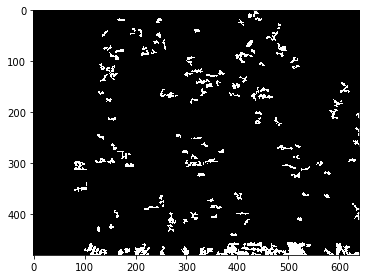

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 3.2441459e+00
  3.2441459e+00 3.2522159e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 3.2201743e+00
  3.2361157e+00 3.2441459e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 3.2201743e+00
  3.2201743e+00 3.2361157e+00]]
[[ 5]
 [16]
 [24]
 [11]
 [28]]
detected object:  person
confidence:  1.0
x-coordinate:  20 	 y-coordinate:indexes 23
width:  594 	 height:  444
person distance: 2.92m

detected object:  person
confidence:  1.0
x-coordinate:  445 	 y-coordinate:indexes 201
width:  101 	 height:  137
person distance: 3.01m

detected object:  person
confidence:  0.6
x-coordinate:  579 	 y-coordinate:indexes 182
width:  59 	 height:  317
person distance

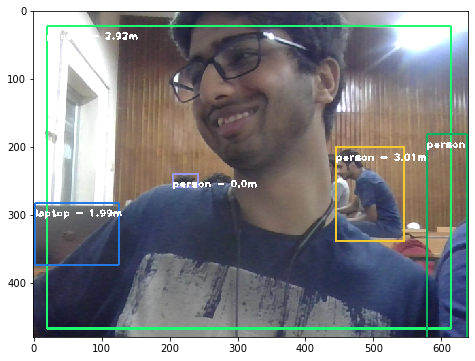

Images from camera: 


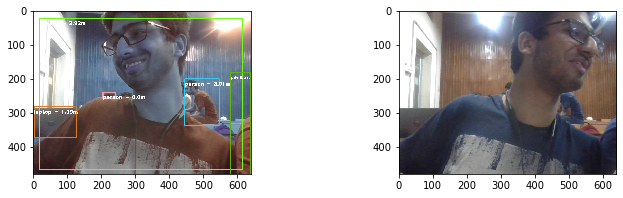

After rectification: 


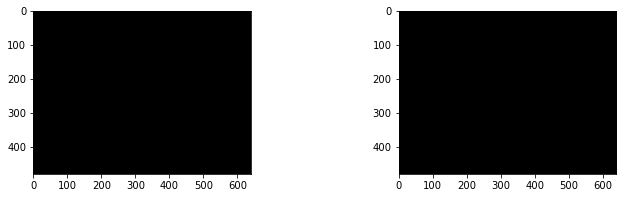

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


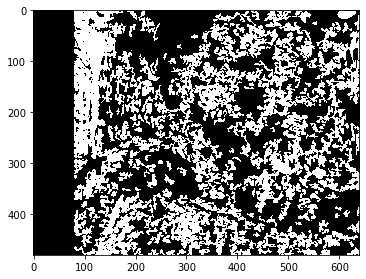

[[8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 8.1711918e+17
  8.1711918e+17 8.1711918e+17]
 ...
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 5.2505651e+00
  5.1880584e+00 5.1675525e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 5.2930799e+00
  5.2930799e+00 5.2930799e+00]
 [8.1711918e+17 8.1711918e+17 8.1711918e+17 ... 5.3581586e+00
  5.3581586e+00 8.1711918e+17]]
[[3]
 [9]]
detected object:  person
confidence:  1.0
x-coordinate:  16 	 y-coordinate:indexes 18
width:  604 	 height:  444
person distance: 3.46m

detected object:  person
confidence:  0.92
x-coordinate:  463 	 y-coordinate:indexes 238
width:  81 	 height:  102
person distance: 3.83m



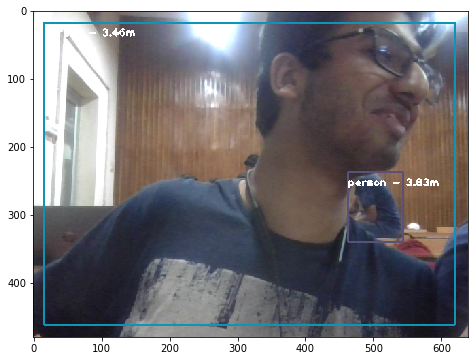

Images from camera: 


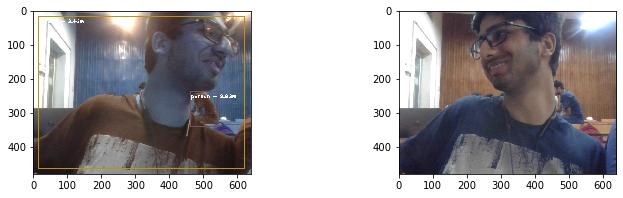

After rectification: 


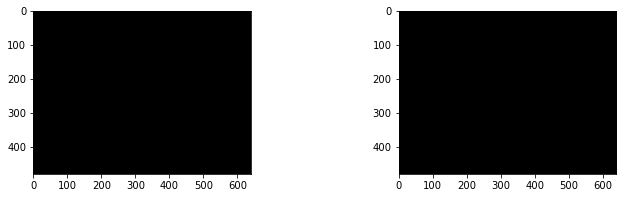

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


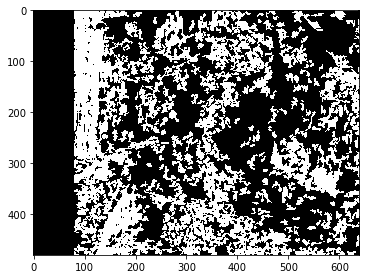

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 4]
 [10]
 [16]
 [14]]
detected object:  person
confidence:  1.0
x-coordinate:  27 	 y-coordinate:indexes 25
width:  580 	 height:  437
person distance: 4.5m

detected object:  person
confidence:  1.0
x-coordinate:  455 	 y-coordinate:indexes 202
width:  92 	 height:  135
person distance: 2.51m

detected object:  person
confidence:  0.59
x-coordinate:  211 	 y-coordinate:indexes 239
width:  32 	 height:  11
person distance: 1.54m

detected object:  person
confidence

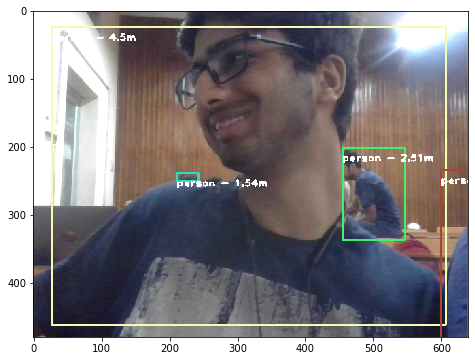

Images from camera: 


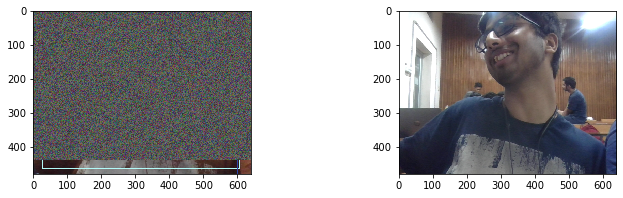

After rectification: 


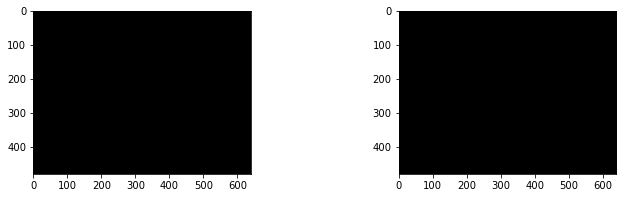

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


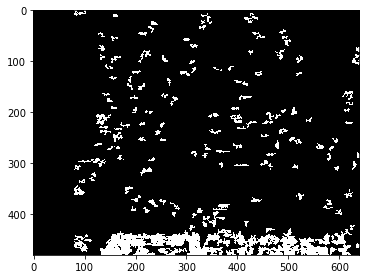

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [13]
 [10]
 [19]]
detected object:  person
confidence:  1.0
x-coordinate:  27 	 y-coordinate:indexes 21
width:  580 	 height:  443
person distance: 4.18m

detected object:  person
confidence:  1.0
x-coordinate:  471 	 y-coordinate:indexes 191
width:  82 	 height:  151
person distance: 1.85m

detected object:  person
confidence:  0.66
x-coordinate:  198 	 y-coordinate:indexes 210
width:  50 	 height:  48
person distance: 6.2m

detected object:  person
confidence

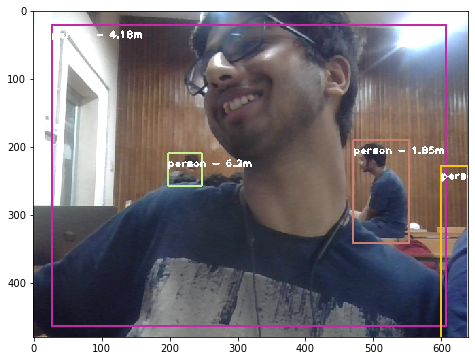

Images from camera: 


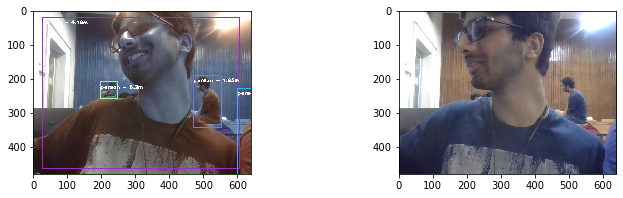

After rectification: 


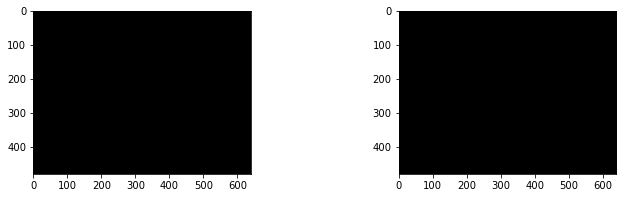

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


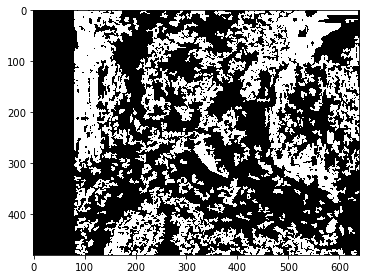

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 2]
 [ 8]
 [14]
 [17]]
detected object:  person
confidence:  1.0
x-coordinate:  20 	 y-coordinate:indexes 21
width:  600 	 height:  440
person distance: 4.46m

detected object:  person
confidence:  1.0
x-coordinate:  462 	 y-coordinate:indexes 195
width:  91 	 height:  148
person distance: 5.8m

detected object:  person
confidence:  0.56
x-coordinate:  599 	 y-coordinate:indexes 232
width:  42 	 height:  253
person distance: 2.96m

detected object:  person
confidenc

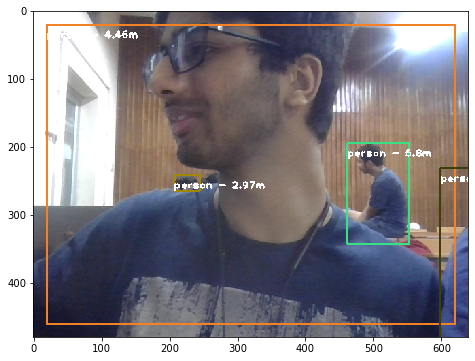

Images from camera: 


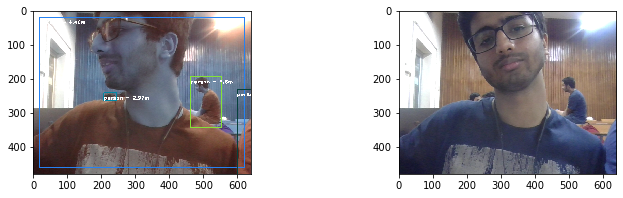

After rectification: 


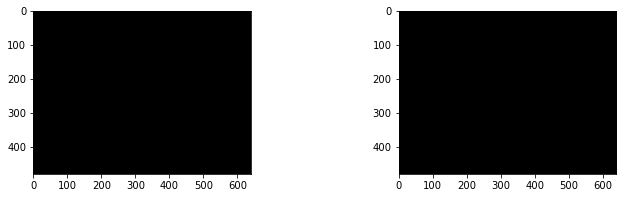

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Depth map:


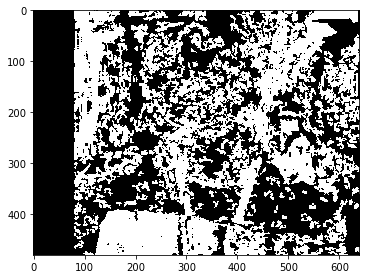

[[8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 ...
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]
 [8.171192e+17 8.171192e+17 8.171192e+17 ... 8.171192e+17 8.171192e+17
  8.171192e+17]]
[[ 3]
 [ 9]
 [17]
 [15]]
detected object:  person
confidence:  1.0
x-coordinate:  49 	 y-coordinate:indexes 27
width:  554 	 height:  430
person distance: 6.15m

detected object:  person
confidence:  1.0
x-coordinate:  466 	 y-coordinate:indexes 193
width:  88 	 height:  150
person distance: 7.3m

detected object:  person
confidence:  0.61
x-coordinate:  196 	 y-coordinate:indexes 242
width:  44 	 height:  24
person distance: 1.43m

detected object:  person
confidence

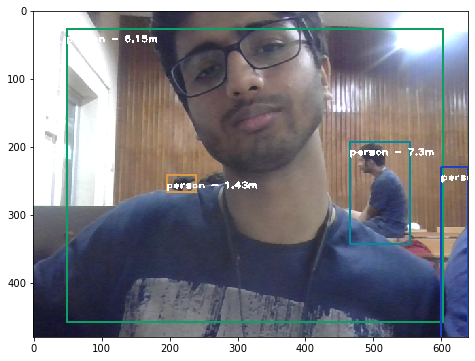

Images from camera: 


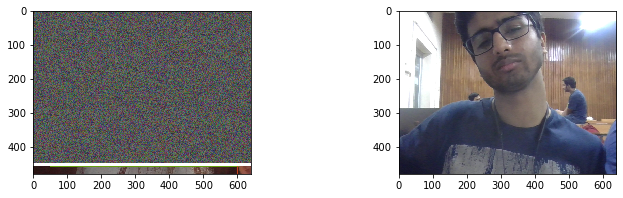

After rectification: 


KeyboardInterrupt: 

In [7]:
while True:
    #rightFrame = cv2.imread("images/right.jpeg")
    #leftFrame = cv2.imread("images/left.jpeg", cv2.IMREAD_COLOR)
    if not (capL.grab() and capR.grab()):
        print("No more frames")
        break

    _, leftFrame = capL.retrieve()
    _, rightFrame = capR.retrieve()

    cv2.imshow("capL", leftFrame)
    cv2.imshow("capR", rightFrame)

    height, width, channel = leftFrame.shape  # We will use the shape for remap

    print("Images from camera: ")
    #plotting
    f, ax = plt.subplots(1,2, figsize=(12, 3))
    ax[0].imshow(cv2.cvtColor(leftFrame, cv2.COLOR_BGR2RGB))
    ax[1].imshow(cv2.cvtColor(rightFrame, cv2.COLOR_BGR2RGB))
    plt.show()

    """
    Undistortion and Rectification part! Undistorts and Rectifies the images using the Calibration codes
    """
    leftMapX, leftMapY = cv2.initUndistortRectifyMap(
        K1, D1, R1, P1, (width, height), cv2.CV_32FC1
    )
    left_rectified = cv2.remap(
        leftFrame, leftMapX, leftMapY, cv2.INTER_LINEAR, cv2.BORDER_CONSTANT
    )
    rightMapX, rightMapY = cv2.initUndistortRectifyMap(
        K2, D2, R2, P2, (width, height), cv2.CV_32FC1
    )
    right_rectified = cv2.remap(
        rightFrame, rightMapX, rightMapY, cv2.INTER_LINEAR, cv2.BORDER_CONSTANT
    )

    print("After rectification: ")
    #plotting
    f, ax = plt.subplots(1,2, figsize=(12, 3))
    ax[0].imshow(cv2.cvtColor(left_rectified, cv2.COLOR_BGR2RGB))
    ax[1].imshow(cv2.cvtColor(right_rectified, cv2.COLOR_BGR2RGB))
    plt.show()


    """
    disp_matrix = depth_map(gray_left, gray_right)
    """
    #We need grayscale for disparity map.
    gray_left = cv2.cvtColor(leftFrame, cv2.COLOR_BGR2GRAY)
    gray_right = cv2.cvtColor(rightFrame, cv2.COLOR_BGR2GRAY)

    disp_matrix = depth_map(rightFrame, leftFrame)  # Get the disparity map
    #print(disp_matrix)

    print("Depth map:")
    plt.figure(figsize=(15, 4.5))
    plt.imshow(cv2.cvtColor(disp_matrix, cv2.COLOR_BGR2RGB))
    plt.show()

    """
    distance_matrix = (base offset x focal length)/disp_matrix
    """
    distance_matrix = []
    base =  0.07 # 1 / Q[3, 2] base offset (distance between the two cameras)
    focal = Q[2, 3] # Focal Length of the cameras

    infi = 10e15;count =0
    for i in range(disp_matrix.shape[0]):
        for j in range(disp_matrix.shape[1]): 
            if disp_matrix[i][j] == 0:
                disp_matrix[i][j] = (1/infi)

    distance_matrix = (base*focal)/disp_matrix
    print(distance_matrix)

    """
    VIDEO CAPTURE
    """
    #cap = cv.VideoCapture(0)
    #BGR image loaded
    img = rightFrame
    img_copy = rightFrame

    #while True:
    #_,img = cap.read()
    #height ,width and layersof the image
    height,width,l = img.shape 

    #resize to RGB (0-1 scale) 416 image for yolo
    blob = cv2.dnn.blobFromImage(img, 1/255 , (416,416),(0,0,0) , swapRB= True , crop = False)



    """
    Model Input
    """
    net.setInput(blob)
    output_layers_names = net.getUnconnectedOutLayersNames() #finiding the unconnected layers
    layerOutputs = net.forward(output_layers_names) #returns an array of output layers


    """
    Detecting the rectangle with max confidence
    """
    boxes = [] #stores the top left corner index of the box and the h and w 
    confidences = [] #storesthe max conf of the box 
    class_ids = [] #stores the index of max conf 

    for output in layerOutputs:
        for detection in output:
            scores = detection[5:] #first 5 are the dimensions of box and if object is present or not 
            class_id = np.argmax(scores)
            conf = scores[class_id]
            # Setting confidence threshold = 0.1
            if conf > 0.1:
                cx = int(detection[0]*width) #center x of the box
                cy = int(detection[1]*height) #center y of the box
                w= int(detection[2]*width)
                h=int(detection[3]*height)

                bx = int(cx-w/2) #left corner x
                by = int(cy-h/2) #left corner y

                boxes.append([bx,by,w,h])
                confidences.append((float(conf)))
                class_ids.append(class_id) 

    #Non-max supression
    indexes = cv2.dnn.NMSBoxes(boxes , confidences ,0.3 ,0.4)
    print(indexes)

    #font and different colours
    font = cv2.FONT_HERSHEY_PLAIN 
    colors = np.random.uniform(0,255 , size=(len(boxes),3))
    
    centre = []
    distance = []
    labels = []
    
    #Drawing Rectangles
    for i in indexes.flatten():
        top_leftX,top_leftY,width,height = boxes[i] 
        label = str(classes[class_ids[i]]) #name of the object
        confidence = str(round(confidences[i],2)) #confidence of the object
        #print (i , " : " , label , " : " , confidence )
        print ("detected object: ", label)
        print ("confidence: " , confidence)
        print( "x-coordinate: " , top_leftX , "\t" , "y-coordinate:indexes" , top_leftY)
        print("width: " , width , "\t" , "height: " , height)
        sum =0; count=1; flag=1
        
        for x in range(top_leftY,min(top_leftY+height,480)):
            for y in range(top_leftX,min(top_leftX+width,640)):
                if distance_matrix[x][y]<15:
                    sum += distance_matrix[x][y]
                    if (flag):
                        flag=0
                    else:
                        count+=1
        dist = sum/count
        print(f"{label} distance: {round(dist,2)}m\n")
        if label == "person":
            distance.append(round(dist,2))
            centre.append([top_leftX + (width/2), top_leftY + (height/2)])
        color = colors[i] 
        cv2.rectangle(img_copy , (top_leftX,top_leftY) , (top_leftX+width , top_leftY+height) , color , 2)
        cv2.putText(img_copy,label+" - " + f"{round(dist,2)}m", (top_leftX , top_leftY+20) , font , 1 ,(255,255,255),2)
    
    led_left = 0
    led_right = 0

    mid = 640/2
    if(len(distance) == 0):
        led_left = 0; left_right = 0
    else: 
        i = distance.index(min(distance))
    #     for i in range(len(distance)):
    #         if centre[i][0] <= mid and distance[i] <= 4:
    #             led_left = 1;
    #         elif centre[i][0] > mid and distance[i] <= 4:
    #             led_right = 1
        if centre[i][0] <= mid:
            led_left = 1; left_right = 0
        elif centre[i][0] > mid:
            led_left = 0;left_right = 1
    
    # cv2.imshow(img_copy) 
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
    plt.figure(figsize=(20, 6))
    plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
    plt.show()
    
    key = cv2.waitKey(1)
    if key == 27:
        break